In [1]:
import pandas as pd
import numpy as np 
import math

from sklearn.metrics import roc_auc_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import log_loss
from sklearn.metrics import confusion_matrix

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures

from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.decomposition import PCA

from sklearn.cross_validation import train_test_split

%matplotlib inline
import matplotlib.pyplot as plt
#plt.style.use('ggplot')
import seaborn as sns
sns.set(color_codes=True)

# Load Data

In [17]:
# get data
train_data = pd.read_csv("/Users/andrewkreimer/Documents/ML/Kaggle/Numerai/numerai_training_data.csv")
test_data = pd.read_csv("/Users/andrewkreimer/Documents/ML/Kaggle/Numerai/numerai_tournament_data.csv")

#extract ID
ids = test_data.values[:,0]
test_data.drop(['t_id'], axis=1, inplace=True)

# Data Preprocessing

In [18]:
#numerical & categorical features
numerical = train_data._get_numeric_data().columns
categorical = [item for item in train_data.columns if item not in numerical]

#categorical features hidden as integers with low distinct
threshold = 1100 #for distinct

for x in train_data:
    if train_data[x].unique().shape[0] <= threshold:
        categorical.append(x)

#skip class variable
categorical.remove('target')

categorical_indexes = [train_data.columns.get_loc(x) for x in categorical]

In [19]:
#LabelEncoder
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
for x in categorical:
    train_data[x] = le.fit_transform(train_data[x])
    test_data[x] = le.fit_transform(test_data[x])

In [111]:
#OneHotEncoder
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(categorical_features=categorical_indexes, sparse=False, handle_unknown='ignore')
enc.fit(train_data)
train_data = pd.DataFrame(enc.transform(train_data))
test_data = pd.DataFrame(enc.transform(test_data))

# Feature Engineering

In [20]:
#a-b, a+b, a*b, a/b
for x in numerical[:-1]:
    for y in numerical[:-1]:
        if x is not y:
            train_data.insert(0, 'NEW_' + x + '-' + y, train_data[x] - train_data[y], True)
            train_data.insert(0, 'NEW_' + x + '+' + y, train_data[x] + train_data[y], True)
            train_data.insert(0, 'NEW_' + x + '*' + y, train_data[x] * train_data[y], True)          
            #train_data.insert(0, 'NEW_' + x + '/' + y, train_data[x] / train_data[y], True)          
            
            test_data.insert(0, 'NEW_' + x + '-' + y, test_data[x] - test_data[y], True)
            test_data.insert(0, 'NEW_' + x + '+' + y, test_data[x] + test_data[y], True)
            test_data.insert(0, 'NEW_' + x + '*' + y, test_data[x] * test_data[y], True)                        
            #test_data.insert(0, 'NEW_' + x + '/' + y, test_data[x] / test_data[y], True)

In [21]:
#a^2
for x in numerical[:-1]:
    train_data.insert(0, 'NEW_' + x + '_^2', train_data[x]**2, True)
    test_data.insert(0, 'NEW_' + x + '_^2', test_data[x]**2, True)

In [22]:
#a^3
for x in numerical[:-1]:
    train_data.insert(0, 'NEW_' + x + '_^3', train_data[x]**3, True)
    test_data.insert(0, 'NEW_' + x + '_^3', test_data[x]**3, True)

In [23]:
#sin
for x in numerical[:-1]:
    train_data.insert(0, 'NEW_' + x + '_sin', train_data[x].apply(math.sin), True)
    test_data.insert(0, 'NEW_' + x + '_sin', test_data[x].apply(math.sin), True)

In [24]:
#cos
for x in numerical[:-1]:
    train_data.insert(0, 'NEW_' + x + '_cos', train_data[x].apply(math.cos), True)
    test_data.insert(0, 'NEW_' + x + '_cos', test_data[x].apply(math.cos), True)

In [25]:
#sqrt
for x in numerical[:-1]:
    train_data.insert(0, 'NEW_' + x + '_sqrt', train_data[x].apply(lambda x: math.sqrt(abs(x))), True)
    test_data.insert(0, 'NEW_' + x + '_sqrt', test_data[x].apply(lambda x: math.sqrt(abs(x))), True)

In [26]:
#log2
for x in numerical[:-1]:
    train_data.insert(0, 'NEW_' + x + '_log2', train_data[x].apply(lambda x: math.log(abs(x) + 0.01, 2)), True)
    test_data.insert(0, 'NEW_' + x + '_log2', test_data[x].apply(lambda x: math.log(abs(x) + 0.01, 2)), True)

In [27]:
#log10
for x in numerical[:-1]:
    train_data.insert(0, 'NEW_' + x + '_log10', train_data[x].apply(lambda x: math.log10(abs(x) + 0.01)), True)
    test_data.insert(0, 'NEW_' + x + '_log10', test_data[x].apply(lambda x: math.log10(abs(x) + 0.01)), True)

In [143]:
#exp
for x in numerical[:-1]:
    train_data.insert(0, 'NEW_' + x + '_exp', train_data[x].apply(math.exp), True)
    test_data.insert(0, 'NEW_' + x + '_exp', test_data[x].apply(math.exp), True)

OverflowError: math range error

In [28]:
#log1p
for x in numerical[:-1]:
    train_data.insert(0, 'NEW_' + x + '_log1p', train_data[x].apply(np.log1p), True)
    test_data.insert(0, 'NEW_' + x + '_log1p', test_data[x].apply(np.log1p), True)

In [29]:
print("features in train: ", len(train_data.columns))
print("features in test: ", len(test_data.columns))

('features in train: ', 1450)
('features in test: ', 1449)


#poly
poly = PolynomialFeatures(3)

#extract class variable
class_variable = train_data['target']
train_data.drop(['target'], axis=1, inplace=True)

#transform
train_data = poly.fit_transform(train_data)
test_data = poly.fit_transform(test_data)

#insert class
train_data = pd.DataFrame(train_data)
train_data['target'] = class_variable

In [18]:
#PCA
pca = PCA(n_components=500)

#extract class variable
class_variable = train_data['target']
train_data.drop(['target'], axis=1, inplace=True)

#extraxt components
train_pca = pca.fit_transform(train_data)
test_pca = pca.fit_transform(test_data)

#inject components to DataFrame
train_data = pd.concat([pd.DataFrame(train_pca), train_data], axis=1)
test_data = pd.concat([pd.DataFrame(test_pca), test_data], axis=1)

#insert class
train_data = pd.DataFrame(train_data)
train_data['target'] = class_variable

KeyError: -1

In [15]:
train_data.shape

(96320, 1971)

# Feature Importance

In [33]:
# Feature Importance
from sklearn import datasets
from sklearn import metrics
from sklearn.ensemble import ExtraTreesClassifier

# fit an Extra Trees model to the data
model = ExtraTreesClassifier(n_estimators = 50)
model.fit(train_data.values[:,:-1], train_data.values[:,-1])
# display the relative importance of each attribute
print(model.feature_importances_)

[ 0.00081621  0.00079816  0.00081316 ...,  0.00077045  0.00078529
  0.00079741]


In [34]:
importances = model.feature_importances_
std = np.std([tree.feature_importances_ for tree in model.estimators_], axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(train_data.shape[1]):
    print f, ':', indices[f], train_data.columns[indices[f]], importances[indices[f]]

# Plot the feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices], color="r", yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), indices)
plt.xlim([-1, X.shape[1]])
plt.show()

Feature ranking:
0 : 317 NEW_feature16-feature15 0.000994751167973
1 : 71 NEW_feature20-feature17 0.000966463525923
2 : 470 NEW_feature14-feature4 0.000954649394633
3 : 287 NEW_feature17-feature5 0.000953101709022
4 : 500 NEW_feature13-feature15 0.000948522894267
5 : 245 NEW_feature17-feature20 0.000947072654018
6 : 233 NEW_feature18-feature3 0.000941074855479
7 : 974 NEW_feature5-feature17 0.00093332027926
8 : 1043 NEW_feature4-feature14 0.000923621997335
9 : 923 NEW_feature6-feature14 0.000922248185695
10 : 323 NEW_feature16-feature13 0.000922083098245
11 : 107 NEW_feature20-feature5 0.000920063899286
12 : 878 NEW_feature7-feature9 0.000912085790017
13 : 377 NEW_feature15-feature16 0.000909684482196
14 : 632 NEW_feature11-feature10 0.000909480111724
15 : 236 NEW_feature18-feature2 0.000908350280627
16 : 602 NEW_feature11-feature21 0.000906452887415
17 : 497 NEW_feature13-feature16 0.000906018681225
18 : 547 NEW_feature12+feature19 0.000904259395835
19 : 415 NEW_feature15+feature2 0.0

IndexError: index 1281 is out of bounds for axis 0 with size 1281

# Visualize

In [77]:
train_data

,feature1,feature2,feature3,feature4,feature5,feature6,feature7,feature8,feature9,feature10,...,feature13,feature14,feature15,feature16,feature17,feature18,feature19,feature20,feature21,target
0,871,516,605,930,503,658,392,733,151,794,...,186,653,211,67,282,426,515,228,577,1
1,185,813,497,327,424,467,957,240,821,609,...,708,311,719,769,384,560,565,406,326,0
2,219,845,260,864,312,884,664,336,168,535,...,1,965,25,196,161,780,244,415,803,0
3,596,298,434,185,549,193,98,734,164,842,...,324,243,391,504,503,281,809,492,623,0
4,177,124,43,389,762,482,18,505,32,60,...,423,527,248,334,735,21,558,681,85,0
5,617,346,276,272,779,339,969,314,852,781,...,940,424,940,863,730,344,53,462,544,0
6,187,210,158,120,777,6,152,331,262,546,...,969,121,944,811,563,170,40,569,441,1
7,655,419,195,666,213,679,226,798,148,674,...,213,538,152,57,164,471,769,150,803,0
8,153,867,958,598,106,881,971,116,976,65,...,28,870,63,14,13,990,35,3,71,1
9,675,395,436,81,747,312,950,406,745,659,...,928,43,907,853,788,287,341,714,281,0


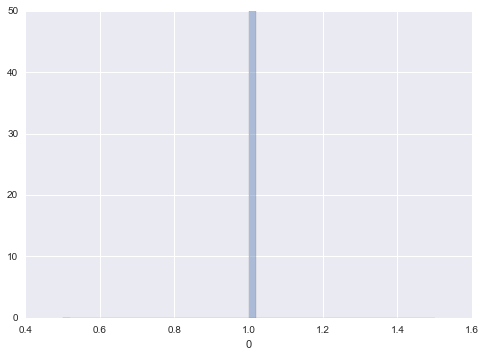

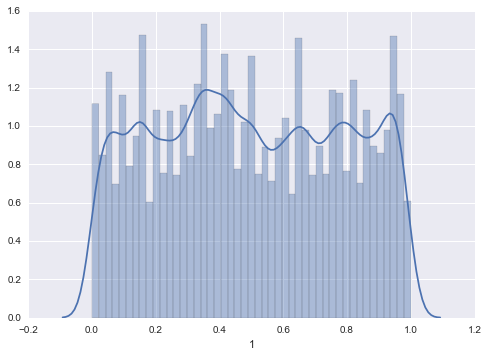

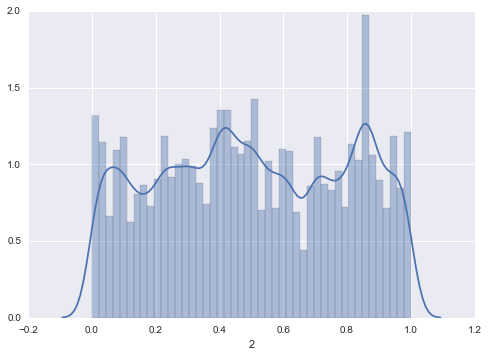

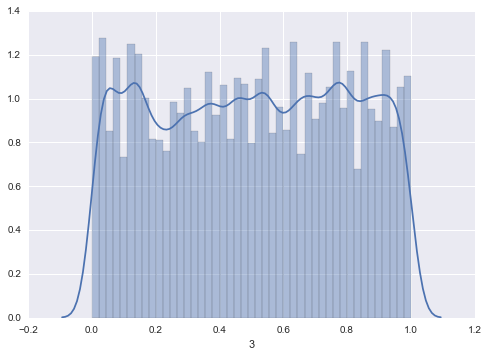

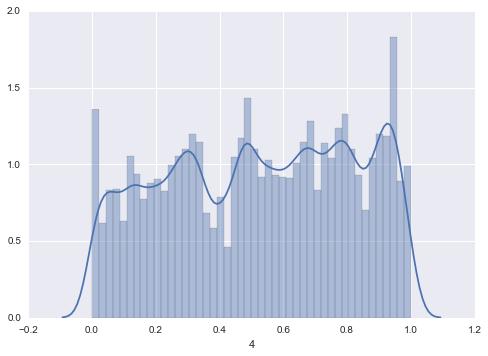

...

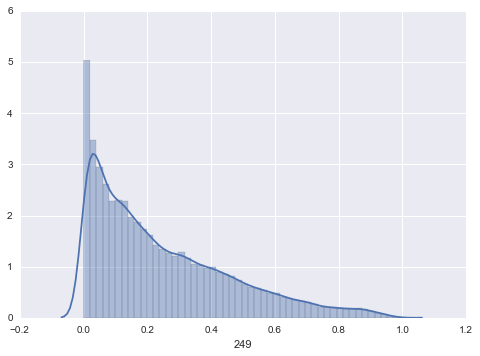

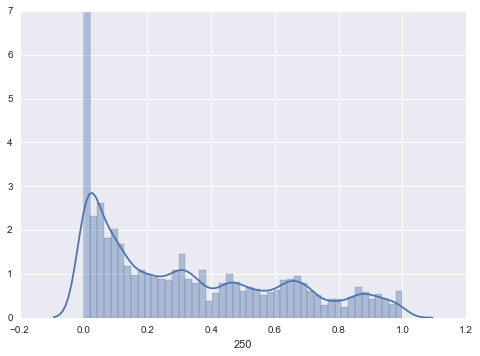

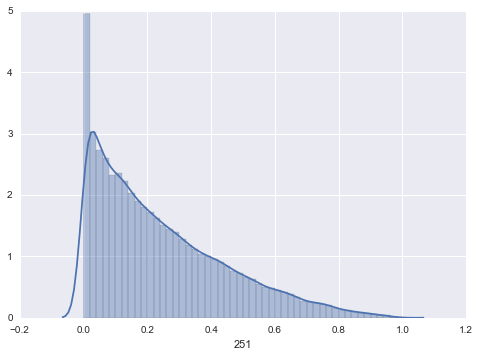

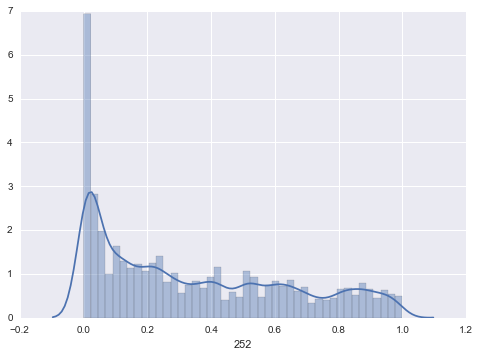

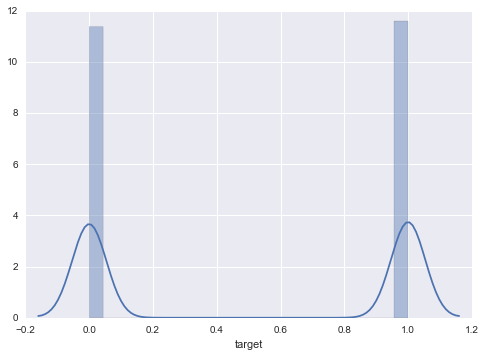

In [164]:
for x in train_data.columns:
    sns.distplot(train_data[x]);
    plt.figure(figsize=(20,20));    
    plt.show();

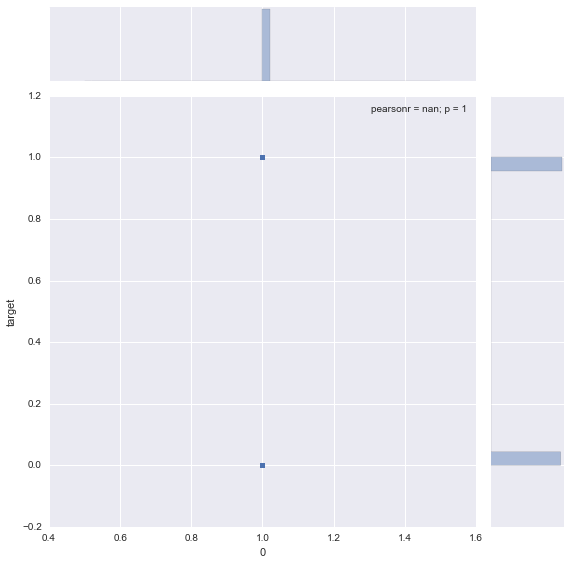

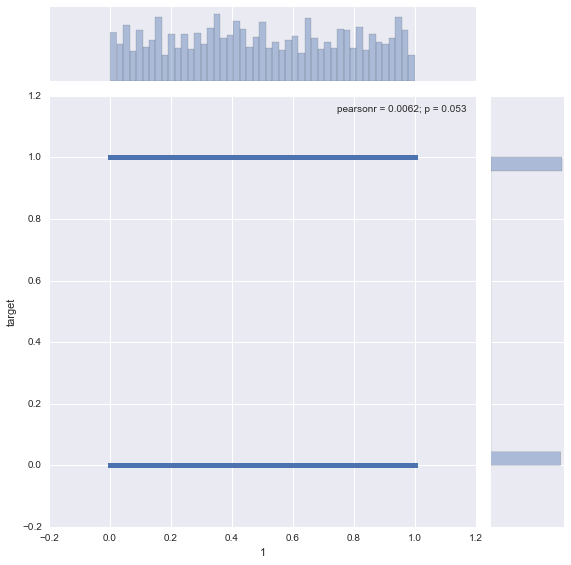

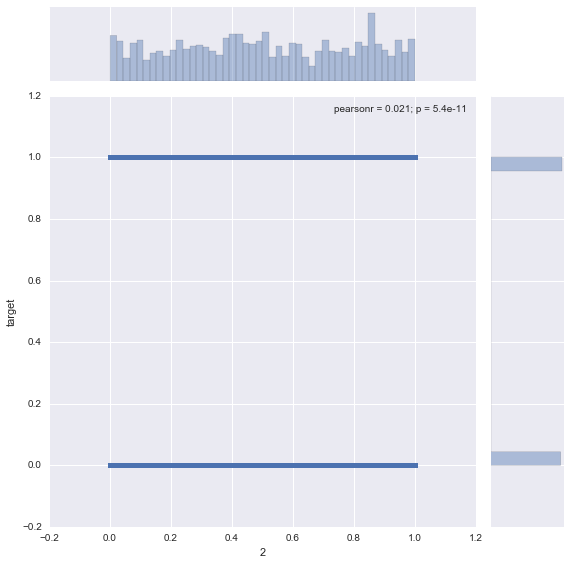

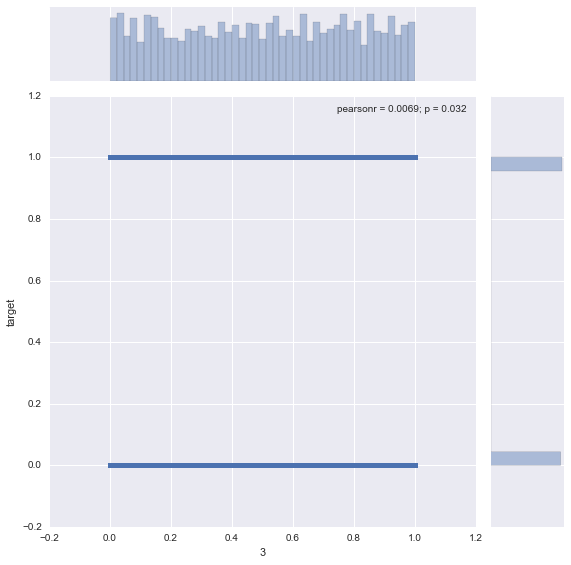

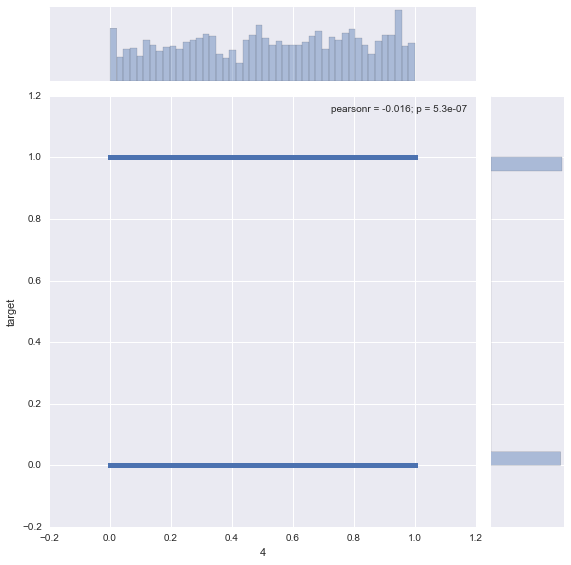

...

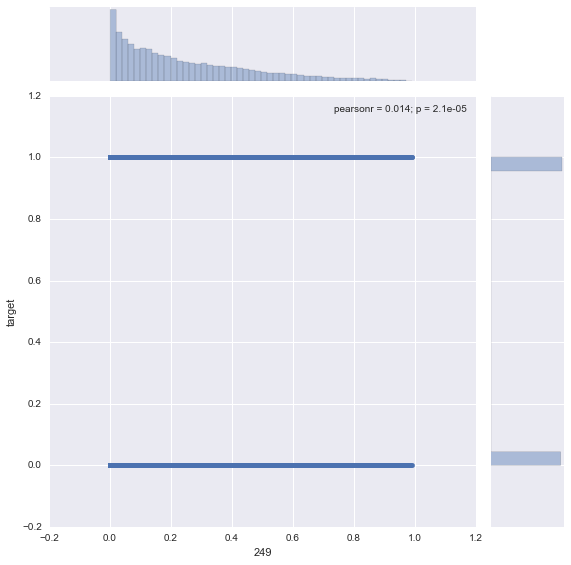

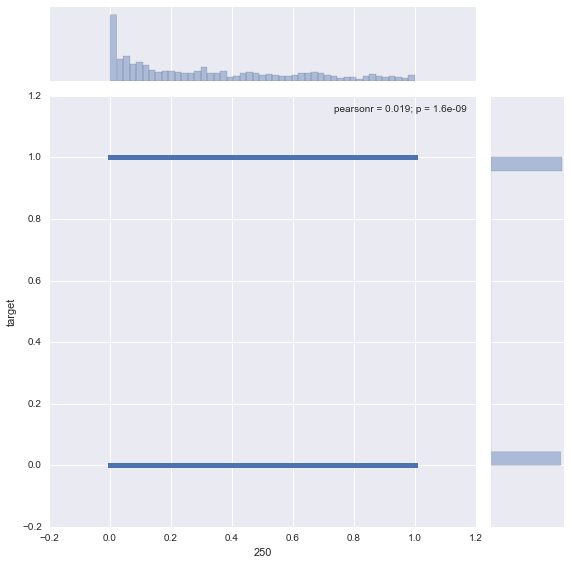

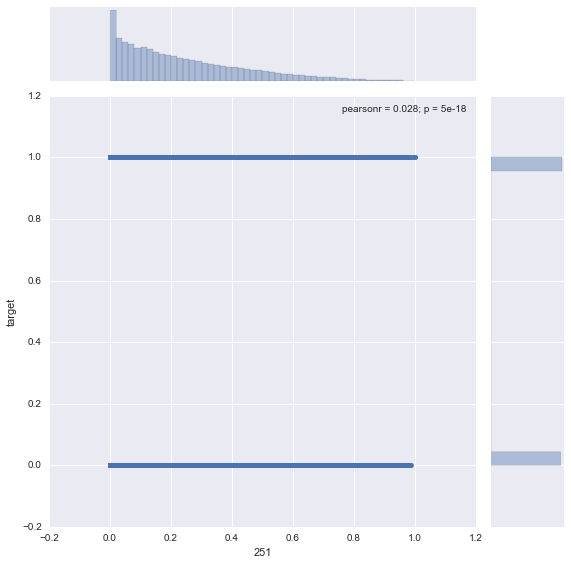

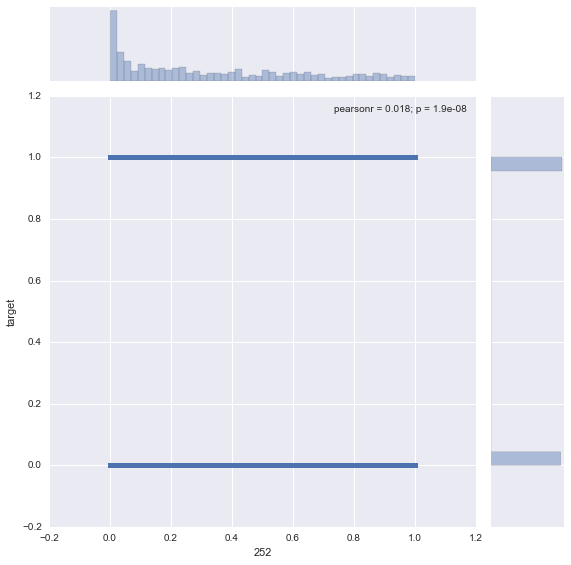

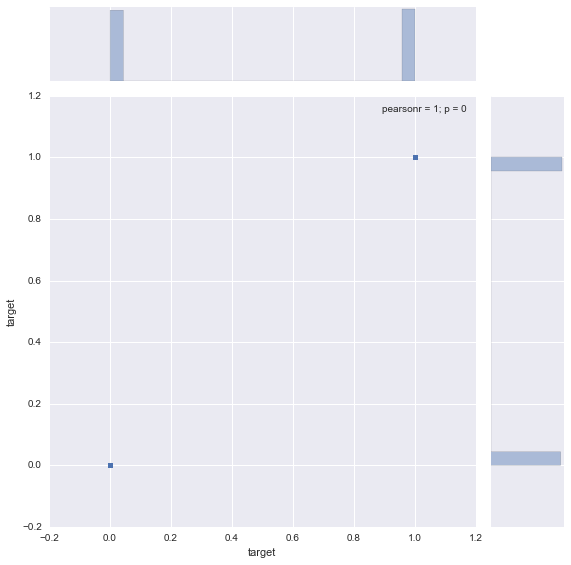

In [165]:
for x in train_data.columns:
    sns.jointplot(x=x, y='target', data=train_data, size=8);
    plt.show();

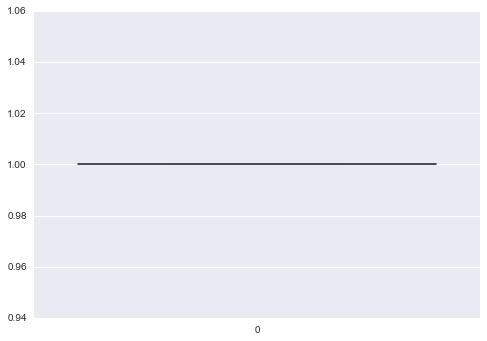

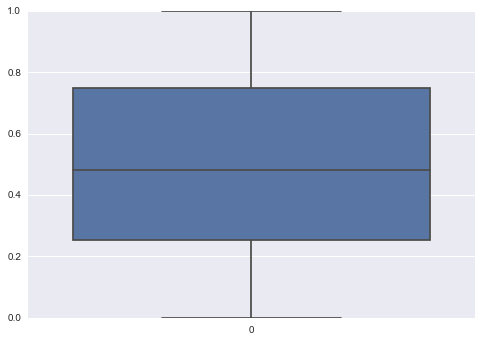

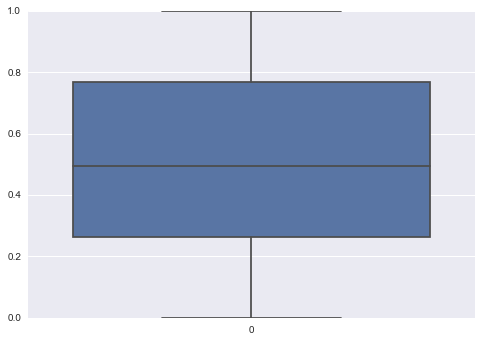

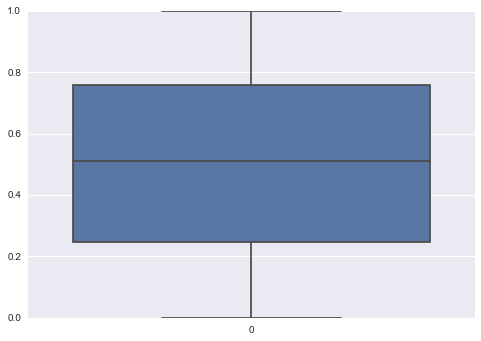

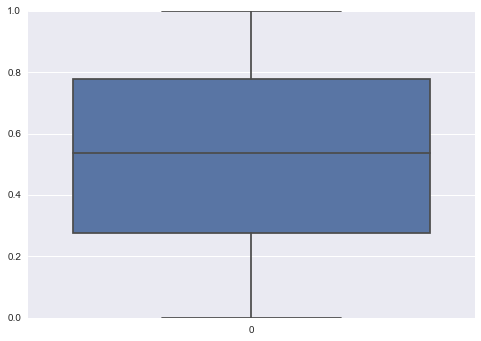

...

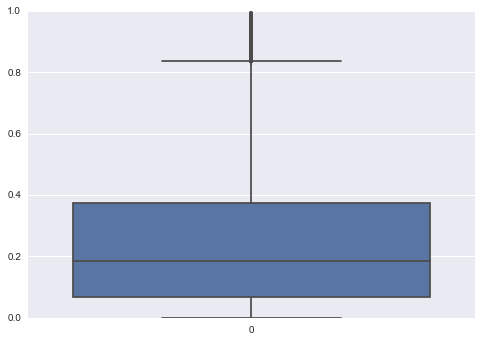

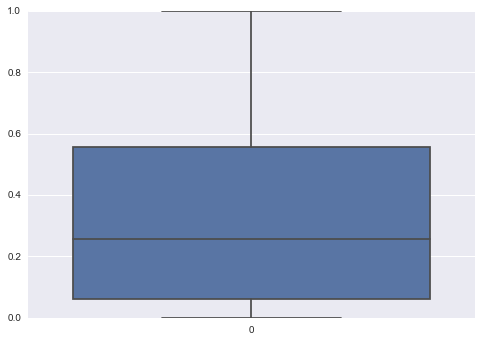

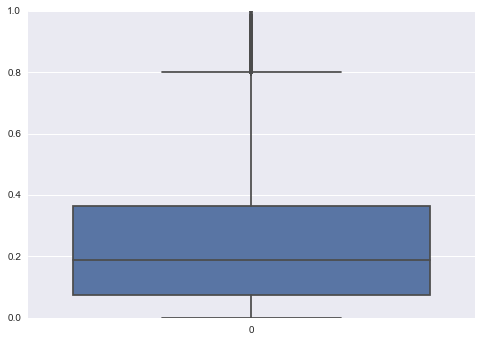

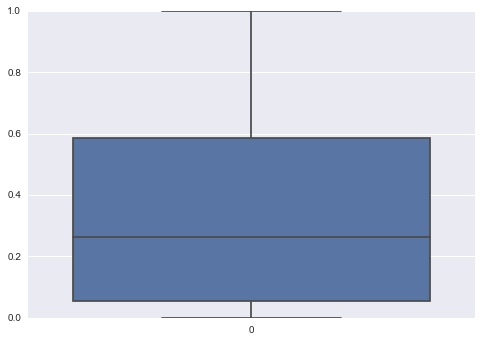

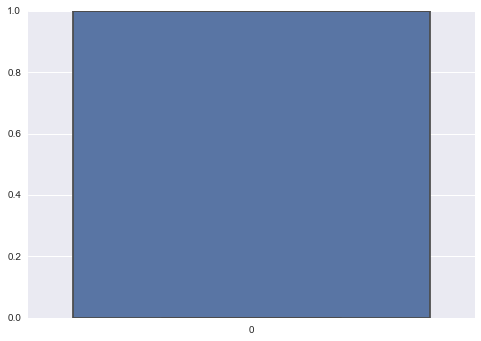

In [166]:
for x in train_data.columns:
    sns.boxplot(data=train_data[x]);
    plt.show();

# Split

In [30]:
#random split
X_train, X_test, y_train, y_test = train_test_split(train_data.values[:,:-1], train_data.values[:,-1], test_size=0.2, random_state=123)

# Train

In [31]:
#classifiers
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC

clfs = {
    #'NB' : GaussianNB()
    #'SGD' : SGDClassifier(learning_rate='optimal', loss='hinge', n_iter=5, n_jobs=1, penalty='l2'),
    #'KNN' : KNeighborsClassifier(n_neighbors=3),    
    #'RF' : RandomForestClassifier(n_estimators=10),
    'GBC' : GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=5, random_state=0)
    #'XGB' : XGBClassifier(max_depth=3, n_estimators=10, learning_rate=0.05),
    #'ETC' : ExtraTreesClassifier(n_estimators=10),
    #'SVC' : SVC(max_iter=10, probability=True),
    #'LR' : LogisticRegression(max_iter=10)    
}

In [32]:
#fit classifiers
fitted_clfs = {}

for j, clf in enumerate(clfs):
    print j, clfs[clf]
    fitted_clfs[clf] = clfs[clf].fit(X_train, y_train)
    print clfs[clf].score(X_test, y_test)
    print '\n'

0 GradientBoostingClassifier(init=None, learning_rate=1.0, loss='deviance',
              max_depth=5, max_features=None, max_leaf_nodes=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=0, subsample=1.0, verbose=0,
              warm_start=False)
0.504723837209




# Evaluate

In [33]:
for j, clf in enumerate(clfs):
    print j, clf
    predictions = clfs[clf].predict(X_test)
    print 'AUC:', roc_auc_score(y_test, predictions)
    print 'RMSE:', mean_squared_error(y_test, predictions)
    print 'Log Loss:', log_loss(y_test, predictions)
    print confusion_matrix(y_test, predictions)
    print '\n'

0 GBC
AUC: 0.504670766614
RMSE: 0.495276162791
Log Loss: 17.1064312115
[[4761 4784]
 [4757 4962]]




# Submission

In [34]:
submission = '/Users/andrewkreimer/Documents/ML/Kaggle/Numerai/submissions/2016-06-28.csv'

proba = clfs[clf].predict_proba(test_data)

with open(submission, 'w') as outfile:
    outfile.write('t_id,probability\n')
    
    count = 0
    for x in proba:
        outfile.write(str(int(ids[count])) + "," + str(proba[count][1]) + "\n")
        count = count + 1
        
    outfile.close()